<a href="https://colab.research.google.com/github/Smasko7/Poverty-Prediction-Challenge/blob/main/Poverty_EDA_and_Preprocessing.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

In [1]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
from sklearn.model_selection import train_test_split
from sklearn.ensemble import RandomForestClassifier
from sklearn.metrics import accuracy_score, f1_score, precision_score, recall_score, mean_absolute_error
from scipy import stats
from sklearn import tree
import itertools
from sklearn.model_selection import GridSearchCV
from sklearn.preprocessing import StandardScaler

## Load Train Dataset

In [3]:
df = pd.DataFrame(pd.read_csv("train_hh_features.csv"))
print(f"Train Dataset Number of samples: {df.shape[0]} and Number of features: {df.shape[1]}")
df

Train Dataset Number of samples: 104234 and Number of features: 88


,hhid,com,weight,strata,utl_exp_ppp17,male,hsize,num_children5,num_children10,num_children18,...,consumed4200,consumed4300,consumed4400,consumed4500,consumed4600,consumed4700,consumed4800,consumed4900,consumed5000,survey_id
0,100001,1,75,4,594.80627,Female,1,0,0,0,...,Yes,No,No,No,Yes,Yes,Yes,Yes,No,100000
1,100002,1,150,4,1676.27230,Female,2,0,0,0,...,Yes,No,No,No,No,Yes,Yes,No,No,100000
2,100003,1,375,4,506.93719,Male,5,0,0,2,...,Yes,Yes,No,Yes,Yes,Yes,Yes,No,Yes,100000
3,100004,1,375,4,824.61786,Male,5,0,0,1,...,No,Yes,No,No,No,Yes,Yes,No,No,100000
4,100005,1,525,4,351.47644,Male,7,1,0,0,...,Yes,No,No,Yes,No,Yes,Yes,Yes,No,100000
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
104229,337458,1,616,7,143.58849,Female,4,2,1,0,...,Yes,No,No,No,No,Yes,Yes,No,Yes,300000
104230,337459,1,616,7,268.44803,Female,4,0,0,1,...,Yes,No,No,No,No,Yes,No,No,No,300000
104231,337460,1,1540,7,243.47612,Male,10,2,3,2,...,Yes,No,No,Yes,No,Yes,Yes,No,No,300000
104232,337461,1,1232,7,337.12079,Male,8,0,0,3,...,Yes,Yes,No,Yes,No,No,Yes,Yes,Yes,300000


## Dataset's statistical analysis

In [7]:
df.describe()

,hhid,com,weight,strata,utl_exp_ppp17,hsize,num_children5,num_children10,num_children18,age,...,share_secondary,sfworkershh,region1,region2,region3,region4,region5,region6,region7,survey_id
count,104234.000000,104234.0,104234.000000,104234.000000,104149.000000,104234.000000,104234.000000,104234.000000,104234.000000,104234.000000,...,104211.000000,104234.000000,104234.000000,104234.000000,104234.000000,104234.000000,104234.000000,104234.000000,104234.000000,104234.000000
mean,222499.501497,1.0,926.357254,4.424813,510.439284,3.611653,0.287872,0.338066,0.571004,52.589414,...,0.228974,0.320479,0.232736,0.157166,0.106395,0.053150,0.235959,0.098653,0.115941,205059.769365
std,83279.120172,0.0,1121.680081,2.429095,437.475542,1.927880,0.561682,0.598281,0.831472,15.732361,...,0.315510,0.400869,0.422577,0.363959,0.308344,0.224333,0.424599,0.298197,0.320156,81587.641825
min,100001.000000,1.0,2.000000,1.000000,0.000000,1.000000,0.000000,0.000000,0.000000,15.000000,...,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,100000.000000
25%,126059.250000,1.0,270.000000,2.000000,190.115800,2.000000,0.000000,0.000000,0.000000,41.000000,...,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,100000.000000
50%,219929.500000,1.0,582.000000,5.000000,411.917570,3.000000,0.000000,0.000000,0.000000,52.000000,...,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,200000.000000
75%,311403.750000,1.0,1128.000000,7.000000,722.440060,5.000000,0.000000,1.000000,1.000000,64.000000,...,0.500000,0.500000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,300000.000000
max,337462.000000,1.0,23832.000000,8.000000,5880.471200,21.000000,5.000000,6.000000,6.000000,98.000000,...,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,300000.000000


From the train dataset's statistical analysis we can easily observe that "com" feature is 1.0 for all samples, so it should be dropped before any model training. Also, the features "survey_id" and "hhid", even though they might help in separateing the survey samples, they must be dropped too.

## EDA Profile Report

With EDA profile report that follows, we will better understand the train dataset, including the features distributions, correlations and missing values.

In [4]:
!pip install ydata_profiling

   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 398.7/398.7 kB 8.5 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 296.7/296.7 kB 20.0 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 3.1/3.1 MB 68.3 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 679.7/679.7 kB 39.3 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 105.4/105.4 kB 7.0 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 43.3/43.3 kB 2.5 MB/s eta 0:00:00


In [5]:
from ydata_profiling import ProfileReport

profile = ProfileReport(df, title="Pandas Profiling Report")

In [6]:
profile

Summarize dataset:   0%|          | 0/5 [00:00<?, ?it/s]


100%|██████████| 88/88 [00:22<00:00,  3.87it/s]


Generate report structure:   0%|          | 0/1 [00:00<?, ?it/s]

Render HTML:   0%|          | 0/1 [00:00<?, ?it/s]

The above EDA profile report shows that there are specific features with some missing values that need to be handled before any model training. Also, we have to convert all the categorical features into numerical and apply ordinal or one-hot encoding wherever needed.

## Convert categorical features into numbers according to feature_value_descriptions.csv

Create a mapping to convert categorical features into numbers. The mapping is from the feature_value_descriptions.csv file. The encoding of this file is not perfect for model training, because for some features there is increasing indexing of categorical values, without corresponding to actual ordinal encoding. Thus, further pre-processing should be made.

In [8]:
val_desc = pd.DataFrame(pd.read_csv("feature_value_descriptions.csv"))
df = pd.DataFrame(pd.read_csv("train_hh_features.csv"))

def categ_to_num_encoding(val_desc, df):

  mapping_dict = {}
  for var in val_desc['Variable name'].unique():
      subset = val_desc[val_desc['Variable name'] == var]
      mapping_dict[var] = dict(zip(subset['Value label'], subset['Value']))

  print("Mapping of categorical variables from feature_value_descriptions.csv file:\n\n", mapping_dict)

  for col, mapping in mapping_dict.items():
      if col in df.columns:
          df[col] = df[col].map(mapping)

  return df


df = categ_to_num_encoding(val_desc, df)

df.head()

Mapping of categorical variables from feature_value_descriptions.csv file:

 {'any_nonagric': {'No': 0, 'Yes': 1}, 'consumed100': {'No': 0, 'Yes': 1}, 'consumed1000': {'No': 0, 'Yes': 1}, 'consumed1100': {'No': 0, 'Yes': 1}, 'consumed1200': {'No': 0, 'Yes': 1}, 'consumed1300': {'No': 0, 'Yes': 1}, 'consumed1400': {'No': 0, 'Yes': 1}, 'consumed1500': {'No': 0, 'Yes': 1}, 'consumed1600': {'No': 0, 'Yes': 1}, 'consumed1700': {'No': 0, 'Yes': 1}, 'consumed1800': {'No': 0, 'Yes': 1}, 'consumed1900': {'No': 0, 'Yes': 1}, 'consumed200': {'No': 0, 'Yes': 1}, 'consumed2000': {'No': 0, 'Yes': 1}, 'consumed2100': {'No': 0, 'Yes': 1}, 'consumed2200': {'No': 0, 'Yes': 1}, 'consumed2300': {'No': 0, 'Yes': 1}, 'consumed2400': {'No': 0, 'Yes': 1}, 'consumed2500': {'No': 0, 'Yes': 1}, 'consumed2600': {'No': 0, 'Yes': 1}, 'consumed2700': {'No': 0, 'Yes': 1}, 'consumed2800': {'No': 0, 'Yes': 1}, 'consumed2900': {'No': 0, 'Yes': 1}, 'consumed300': {'No': 0, 'Yes': 1}, 'consumed3000': {'No': 0, 'Yes': 1}, 

,hhid,com,weight,strata,utl_exp_ppp17,male,hsize,num_children5,num_children10,num_children18,...,consumed4200,consumed4300,consumed4400,consumed4500,consumed4600,consumed4700,consumed4800,consumed4900,consumed5000,survey_id
0,100001,1,75,4,594.80627,0,1,0,0,0,...,1.0,0.0,0.0,0.0,1.0,1.0,1.0,1.0,0.0,100000
1,100002,1,150,4,1676.27230,0,2,0,0,0,...,1.0,0.0,0.0,0.0,0.0,1.0,1.0,0.0,0.0,100000
2,100003,1,375,4,506.93719,1,5,0,0,2,...,1.0,1.0,0.0,1.0,1.0,1.0,1.0,0.0,1.0,100000
3,100004,1,375,4,824.61786,1,5,0,0,1,...,0.0,1.0,0.0,0.0,0.0,1.0,1.0,0.0,0.0,100000
4,100005,1,525,4,351.47644,1,7,1,0,0,...,1.0,0.0,0.0,1.0,0.0,1.0,1.0,1.0,0.0,100000


## Apply Ordinal Encoding where needed

In this step, we apply ordinal encoding for features: "water_source", "sanitation_source", "educ_max" and "dweltyp". The encodings in the feature_value_descriptions.csv file, that were previously applied in the dataset, are arbitrary. These overrides tell the model that 'Piped Water' is qualitatively better than 'Surface Water' etc. In other words, common sense is used to put the feature categories in order.

In [9]:
def apply_ordinal_encoding(val_desc, df):

# The encodings in the feature_value_descriptions.csv file are arbitrary. These overrides tell the model
  # that 'Piped Water' is qualitatively better than 'Surface Water' etc
  overrides = {
    'water_source': {
        1: 14,  # Piped water into dwelling (Best)
        2: 13,  # Piped water to yard/plot
        7: 12,  # Bottled water
        3: 11,  # Public tap or standpipe
        5: 10,  # Protected dug well
        6: 9,   # Protected spring
        4: 8,   # Tubewell or borehole
        8: 7,   # Rainwater
        12: 6,  # Tanker-truck
        11: 5,  # Cart with small tank/drum
        9: 4,   # Unprotected spring
        10: 3,  # Unprotected dug well
        13: 2,  # Surface water
        14: 1,   # Other
        'NaN': 0
    },
    'sanitation_source': {
        2: 14,  # A piped sewer system (Best)
        1: 13,  # A flush toilet
        3: 12,  # A septic tank
        5: 11,  # Ventilated improved pit latrine
        6: 10,  # Pit latrine with slab
        7: 9,   # Composting toilet
        4: 8,   # Pit latrine
        9: 7,   # A flush/pour flush to elsewhere
        10: 6,  # A pit latrine without slab
        8: 5,   # Special case
        11: 4,  # Bucket
        12: 3,  # Hanging toilet or hanging latrine
        13: 2,  # No facilities or bush or field
        14: 1   # Other
    },
    'educ_max': {
        6: 7,   # Complete Tertiary Education
        5: 6,   # Incomplete Tertiary Education
        4: 5,   # Complete Secondary Education
        3: 4,   # Incomplete Secondary Education
        2: 3,   # Complete Primary Education
        1: 2,   # Incomplete Primary Education
        0: 1    # Never attended
    },
    'dweltyp': {
        1: 9,   # Detached house (Most stable)
        3: 8,   # Separate apartment
        2: 7,   # Multi-family house
        7: 6,   # Several separate buildings
        6: 5,   # Several buildings connected
        5: 4,   # Room in a larger dwelling
        4: 3,   # Communal apartment
        8: 2,   # Improvised housing unit
        99: 1   # Other
    }
  }


  for col in df.columns:
    # Apply Ordinal Quality Ranks if applicable
    if col in overrides:
        df[col] = df[col].map(overrides[col])

  return df


df = apply_ordinal_encoding(val_desc, df)

df.head()

,hhid,com,weight,strata,utl_exp_ppp17,male,hsize,num_children5,num_children10,num_children18,...,consumed4200,consumed4300,consumed4400,consumed4500,consumed4600,consumed4700,consumed4800,consumed4900,consumed5000,survey_id
0,100001,1,75,4,594.80627,0,1,0,0,0,...,1.0,0.0,0.0,0.0,1.0,1.0,1.0,1.0,0.0,100000
1,100002,1,150,4,1676.27230,0,2,0,0,0,...,1.0,0.0,0.0,0.0,0.0,1.0,1.0,0.0,0.0,100000
2,100003,1,375,4,506.93719,1,5,0,0,2,...,1.0,1.0,0.0,1.0,1.0,1.0,1.0,0.0,1.0,100000
3,100004,1,375,4,824.61786,1,5,0,0,1,...,0.0,1.0,0.0,0.0,0.0,1.0,1.0,0.0,0.0,100000
4,100005,1,525,4,351.47644,1,7,1,0,0,...,1.0,0.0,0.0,1.0,0.0,1.0,1.0,1.0,0.0,100000


## Handle Missing values

### First check the NaN values of train set

In [10]:
df_copy_nan_values = df.isna().sum()

df_nonzero_nan = df_copy_nan_values[df_copy_nan_values != 0].to_frame(name="nan_count")
df_nonzero_nan

,nan_count
utl_exp_ppp17,85
dweltyp,1206
employed,45
share_secondary,23
educ_max,23
sector1d,14129
consumed100,2
consumed200,2
consumed300,2
consumed400,2


We observe that the features with missing values are: "utl_exp_ppp17", "dweltyp", "employed", "share_secondary", "educ_max", "sector1d" and all the "consumedXXXX" features.

Not all features' missing handles need the same treatment, so we handle them separately.

### Handle the 'dweltyp' and 'consumedXXXX' missing values

First, we add an extra column 'dweltyp_is_missing', indicating the missing values for 'dweltyp', because of the large volume of NaN values it has. Also, we fill the 'dweltyp' missing values with -1.

Additionally, we fill the missing values of 'consumedXXXX' columns with 0. Those features are binary and a missing value probably indicates lack of consumption.

In [11]:
def handle_dweltyp_and_consumed(df):

  # Add Missing Indicators for dweltyp, which has many nan values
  high_nan_cols = ['dweltyp']
  for col in high_nan_cols:
      if col in df.columns:
          df[f'{col}_is_missing'] = df[col].isnull().astype(int)

  # fill dweltyp nan values with -1 to indicate missing values
  df['dweltyp'] = df['dweltyp'].fillna(-1)

  # Consumption columns missing values (Constant 0)
  cons_cols = [c for c in df.columns if c.startswith('consumed')]
  for col in cons_cols:
      df[col] = df[col].fillna(0)


  return df


We oberve that some features' missing values are directly related to other features' missing values.

Specifically, the households with missing values in 'sector1d' are those with either 'employed' = 0 or 'employed' = NaN. This means that if the job sector is missing in a household, either the 'emplyed' value is missing or the head of the household is unemployed.

We fill the 'employed' missing values as the most frequent answer of the feature (0 or 1). Then, for the households with filled (imputed) 'employed' values 0, we also fill the corresponding 'sector1d' values with 0. But, for the households with imputed 'employed' values 1, we fill the corresponding 'sector1d' values with the most frequent answer (sector) of 'sector1d' feature.

Also, 'share_secondary' is directly related to 'educ_max', so we first fill the 'educ_max' feature with its most frequent value and then we fill the corresponding missing values of 'share_secondary' with the median value of households with the most frequent 'educ_max'.

All the above **handlings of missing values are performed per survey**, to preserve the distribution of each survey. This prevents "leakage" across different surveys.

In [12]:
def handle_sector1d(df):
  # Set unemployed sector1d to 0
  df.loc[df['employed'] == 0, 'sector1d'] = 0

  df = pd.get_dummies(df, columns=['sector1d'], prefix='sector', dtype=int, dummy_na=False)

  return df

In [13]:
def handle_missing_values(df):
    df = df.copy()

    df = handle_dweltyp_and_consumed(df)

    surveys = df['survey_id'].unique()

    for s_id in surveys:
        s_mask = (df['survey_id'] == s_id)

        # Impute 'employed' and 'educ_max' with Survey's most frequent answer
        for col in ['employed', 'educ_max']:
            if col in df.columns:
                # Identify which were NaN before filling
                was_nan = df[s_mask][col].isna()
                mode_val = df[s_mask][col].mode()

                if not mode_val.empty:
                    # Fill NaNs with the most frequent value in the survey
                    df.loc[s_mask, col] = df.loc[s_mask, col].fillna(mode_val[0])

                    if col == 'employed':
                        # Find households that were NaN and are now 1 (Employed)
                        newly_emp = s_mask & was_nan & (df['employed'] == 1)
                        newly_unemp = s_mask & was_nan & (df['employed'] == 0)

                        # Set Unemployed to Sector 0
                        df.loc[newly_unemp, 'sector1d'] = 0

                        # Set newly Employed (after the imputation) to the most frequent sector in that survey
                        emp_sector_mode = df[s_mask & (df['employed'] == 1)]['sector1d'].mode()
                        if not emp_sector_mode.empty:
                            df.loc[newly_emp, 'sector1d'] = df.loc[newly_emp, 'sector1d'].fillna(emp_sector_mode[0])

        if 'share_secondary' in df.columns and 'educ_max' in df.columns:
            ss_nan_mask = s_mask & df['share_secondary'].isna()

            # For each educ_max level that has missing share_secondary
            for edu_level in df.loc[ss_nan_mask, 'educ_max'].unique():
                level_mask = ss_nan_mask & (df['educ_max'] == edu_level)

                # Get median share for households with this exact max education in this survey
                contextual_median = df[s_mask & (df['educ_max'] == edu_level)]['share_secondary'].median()

                # If no data exists for that level, default to 0.0
                fill_val = contextual_median if pd.notna(contextual_median) else 0.0
                df.loc[level_mask, 'share_secondary'] = fill_val


    # Fill missing values of sector1d and one hot encode
    df = handle_sector1d(df)

    # Fill utl_exp_ppp17 NaN values with zeros
    df['utl_exp_ppp17'] = df['utl_exp_ppp17'].fillna(0)

    return df

df = handle_missing_values(df)

## Plot target distribution (train labels)

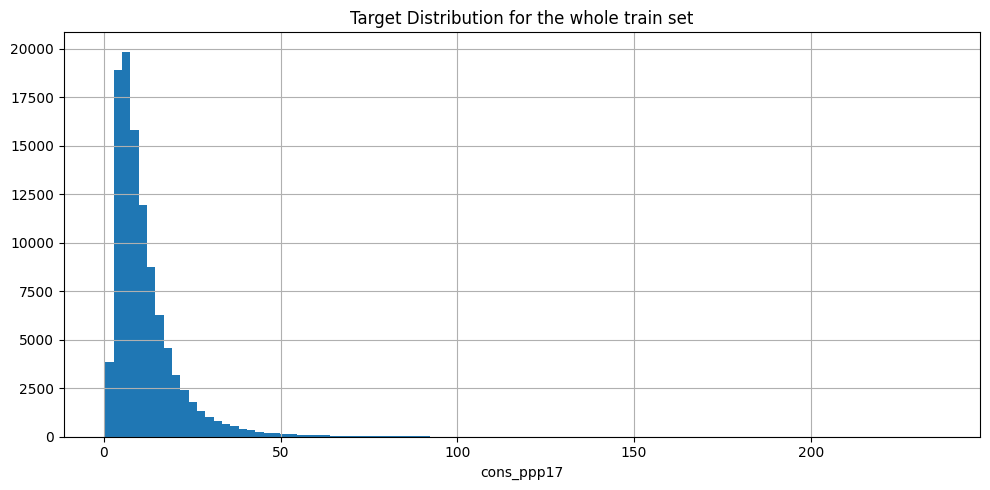

In [14]:
train_labels_df = pd.DataFrame(pd.read_csv("train_hh_gt.csv"))
train_labels_df = train_labels_df["cons_ppp17"]
train_labels_df.hist(figsize = (10,5), bins=100)
plt.title("Target Distribution for the whole train set")
plt.xlabel("cons_ppp17")
plt.tight_layout()
plt.show()

We can see that the distribution of the target variable for the whole train dataset (all 3 surveys) is an exponential (right skewed) distribution.

In the following cells, we are going to check wether the separate distributions for each survey are similar with each other and wether they are also right skewed. In this case, we might consider a log transformation, before training any models.

## Plot target distributions for separate surveys

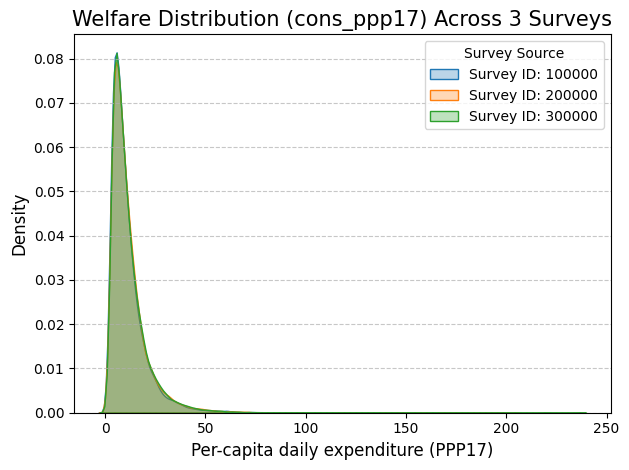

In [15]:
train_labels_df = pd.DataFrame(pd.read_csv("train_hh_gt.csv"))

# Iterate through unique survey IDs
for survey in sorted(train_labels_df['survey_id'].unique()):
    subset = train_labels_df[train_labels_df['survey_id'] == survey]

    # We use a KDE plot for smoother comparison
    sns.kdeplot(
        subset['cons_ppp17'],
        label=f"Survey ID: {survey}",
        fill=True,
        alpha=0.3
    )

plt.title("Welfare Distribution (cons_ppp17) Across 3 Surveys", fontsize=15)
plt.xlabel("Per-capita daily expenditure (PPP17)", fontsize=12)
plt.ylabel("Density", fontsize=12)
plt.legend(title="Survey Source")
plt.grid(axis='y', linestyle='--', alpha=0.7)


plt.tight_layout()
plt.savefig("surveys_target_distro_comparison_plot.png")
plt.show()

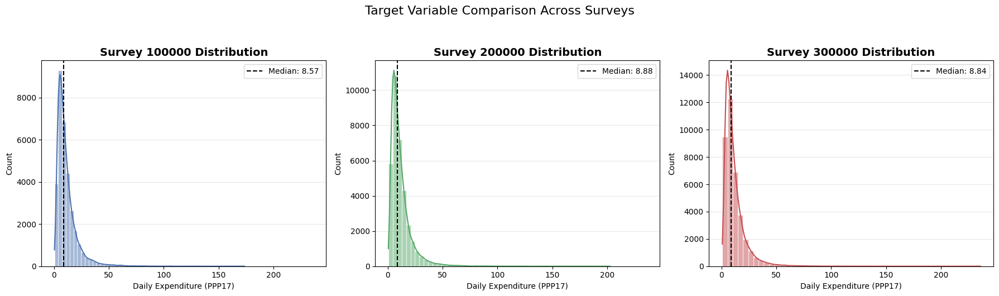

In [16]:
surveys = sorted(train_labels_df['survey_id'].unique())
fig, axes = plt.subplots(1, 3, figsize=(18, 5), sharex=True, sharey=False)

colors = ['#4C72B0', '#55A868', '#C44E52']

for i, s_id in enumerate(surveys):
    subset = train_labels_df[train_labels_df['survey_id'] == s_id]['cons_ppp17']

    sns.histplot(subset, bins=50, kde=True, ax=axes[i], color=colors[i], edgecolor='white')

    median_val = subset.median()
    axes[i].axvline(median_val, color='black', linestyle='--', label=f'Median: {median_val:.2f}')

    axes[i].set_title(f"Survey {s_id} Distribution", fontsize=14, fontweight='bold')
    axes[i].set_xlabel("Daily Expenditure (PPP17)")
    axes[i].legend()
    axes[i].grid(axis='y', alpha=0.3)

plt.suptitle("Target Variable Comparison Across Surveys", fontsize=16, y=1.05)
plt.tight_layout()
plt.show()

By observing the above distribution plots of the target variable, we can conclude that the distributions of cons_ppp17 in the 3 surveys are pretty similar to each other.

# Feature Engineering

In [17]:
df.drop(columns=["com", "survey_id", "hhid"], inplace=True)
df.head()

,weight,strata,utl_exp_ppp17,male,hsize,num_children5,num_children10,num_children18,age,owner,...,sector_7.0,sector_8.0,sector_9.0,sector_10.0,sector_11.0,sector_12.0,sector_13.0,sector_14.0,sector_15.0,sector_16.0
0,75,4,594.80627,0,1,0,0,0,75,1,...,0,0,0,0,0,0,0,0,0,0
1,150,4,1676.27230,0,2,0,0,0,61,1,...,0,0,0,0,0,0,0,0,0,0
2,375,4,506.93719,1,5,0,0,2,49,1,...,0,0,1,0,0,0,0,0,0,0
3,375,4,824.61786,1,5,0,0,1,58,0,...,0,0,0,0,0,1,0,0,0,0
4,525,4,351.47644,1,7,1,0,0,57,1,...,0,0,0,0,0,0,0,0,0,0


## Create new, auxiliary features

There are 50 different, binary categorical features in the train dataset that correspond to the consumption of different products/foods. To decrease the number of features, some of the "consumedXXXX" featrues are perfect candidates to be dropped. Thus, we create some new, aggregate features that, hopefully, include information from all 50 consumption features.

The new features are:

1. "dietary_diversity" --> This is a Dietary Diversity Score (Total count of different foods).

2. "grain_score" --> This accounts for the presence of foods like bread, corn, wheat etc, which are essential in a household.

3. "protein_score" --> This is a number that describes the presence of foods full of protein and it is considered as an indicator of relative wealth in a household.

In [18]:
def aggregate_consumption(df):
    # Find all columns starting with 'consumed'
    cons_cols = [c for c in df.columns if c.startswith('consumed')]

    # Dietary Diversity Score (Total count of different foods)
    df['dietary_diversity'] = df[cons_cols].sum(axis=1)

    # Protein vs Carbs (based on feature descriptions)
    # Grains/Starches examples: 100 (Bread), 1500 (Corn), 1600 (Wheat)
    # Proteins: 1000 (Poultry), 1200 (Beef), 2100 (Eggs)
    grains = ['consumed100', 'consumed1500', 'consumed1600', 'consumed1900']
    proteins = ['consumed1000', 'consumed1200', 'consumed2100', 'consumed2300']

    df['grain_score'] = df[[c for c in grains if c in df.columns]].sum(axis=1)
    df['protein_score'] = df[[c for c in proteins if c in df.columns]].sum(axis=1)

    return df


df = aggregate_consumption(df)

## Feature Rank

In the following cells we are going to find the order of feature importances, based on 3 methods: 1. Correlation with target variable, 2. Simple XGBoost Feature importancies and 3. Mutual Information Filter

The 3 lists of ordered features will be combined to give the final list of ranked features.

### Correlations between features and labels ('cons_ppp17')

/tmp/ipython-input-643987386.py:13: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `y` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(x=top_corr.values, y=top_corr.index, palette='RdYlGn')


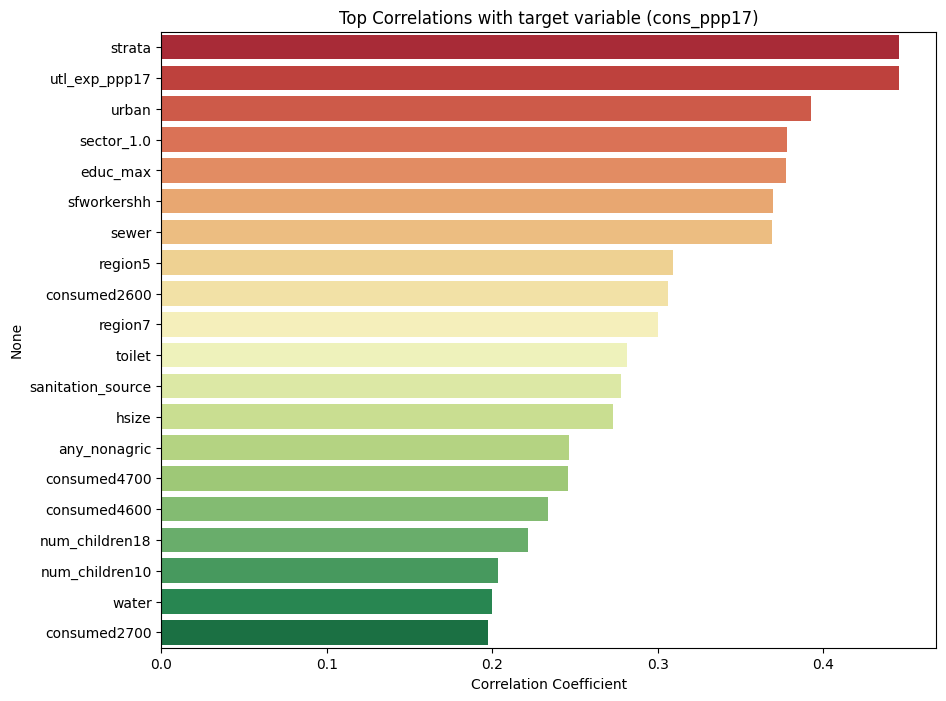

In [19]:
def get_corr_scores(df_features, df_labels, n_top=20):

  X = df_features.copy()
  y = df_labels['cons_ppp17']

  corr_values = X.apply(lambda x: x.corr(y)).abs()
  correlations = corr_values.sort_values(ascending=False)

  plt.figure(figsize=(10, 8))
  # Plot top 20 correlations
  top_corr = correlations.head(20)

  sns.barplot(x=top_corr.values, y=top_corr.index, palette='RdYlGn')
  plt.title('Top Correlations with target variable (cons_ppp17)')
  plt.xlabel('Correlation Coefficient')
  plt.show()

  return correlations


labels_df = pd.DataFrame(pd.read_csv("train_hh_gt.csv"))
correlations = get_corr_scores(df, labels_df, n_top=20)

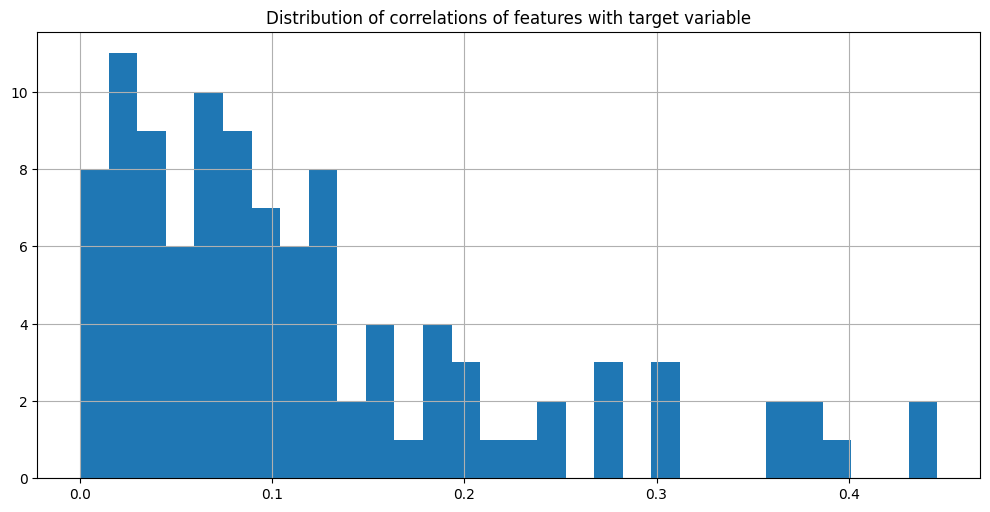

In [23]:
correlations.hist(bins=30, figsize=(10, 5))
plt.tight_layout()
plt.title("Distribution of correlations of features with target variable")
plt.show()

As we can observe from the correlations of the features with the target variable, there are no features with high correlation (e.g. > 0.5), which means that there is not a strong indicator, at least at first glance.

The feature with the highest correlation with the target variable (cons_ppp17) is the stratification feature (strata) and the expenditure on utilities (utl_exp_ppp17), which is completely expected and rational, given that cons_ppp17 and utl_exp_ppp17 variables measure similar things.

### XGBoost Feature Importancies

/tmp/ipython-input-3920321795.py:17: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `y` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(x=top_features.values, y=top_features.index, palette='RdYlGn')


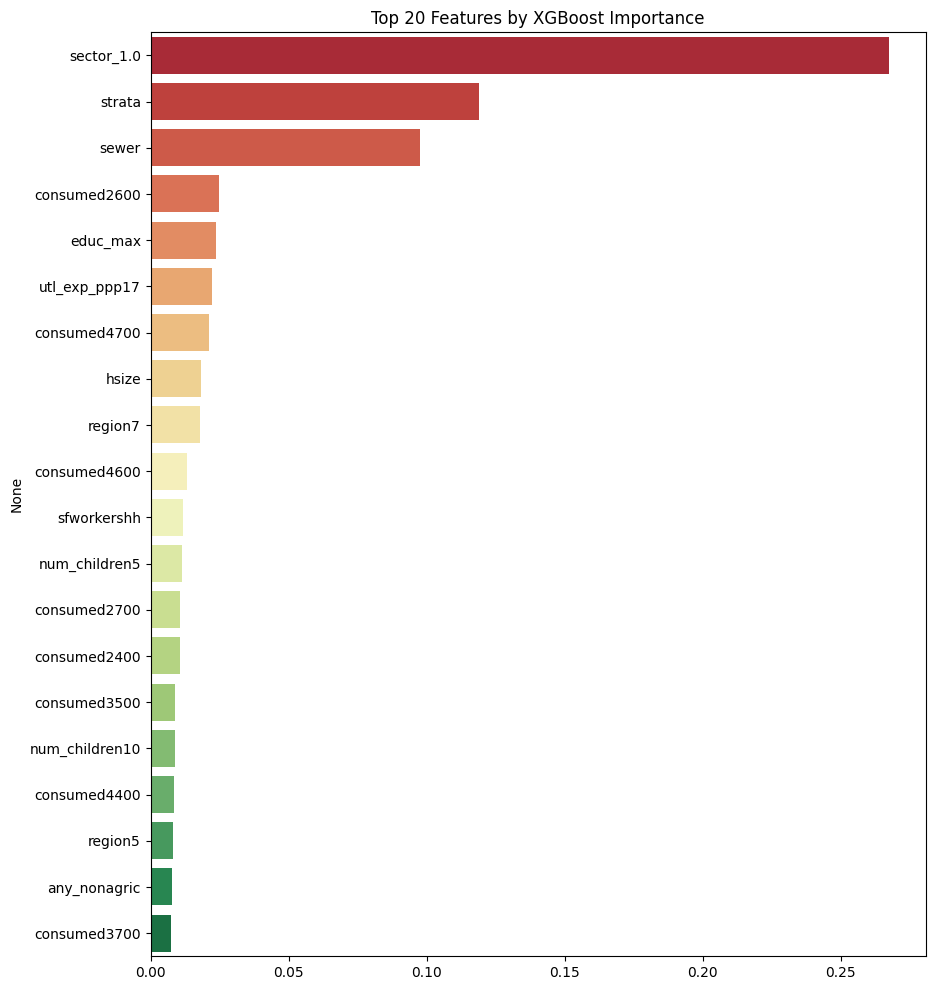

In [20]:
from xgboost import XGBRegressor

def get_feature_importance(df_features, df_labels, n_top=20):

    y = np.log1p(df_labels['cons_ppp17'])

    X = df_features.copy()
    model = XGBRegressor(n_estimators=100, learning_rate=0.1, random_state=42, objective='reg:absoluteerror')
    model.fit(X, y, sample_weight=df_features['weight'])

    importance = pd.Series(model.feature_importances_, index=X.columns)
    importance = importance.sort_values(ascending=False)

    plt.figure(figsize=(10, 12))
    top_features = importance.head(n_top)
    sns.barplot(x=top_features.values, y=top_features.index, palette='RdYlGn')
    plt.title(f"Top {n_top} Features by XGBoost Importance")
    plt.show()

    return importance

labels_df = pd.DataFrame(pd.read_csv("train_hh_gt.csv"))
feature_importances = get_feature_importance(df, labels_df, n_top=20)

### Mutual Information Filter

/tmp/ipython-input-4109753950.py:15: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `y` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(x=top_features.values, y=top_features.index, palette='RdYlGn')


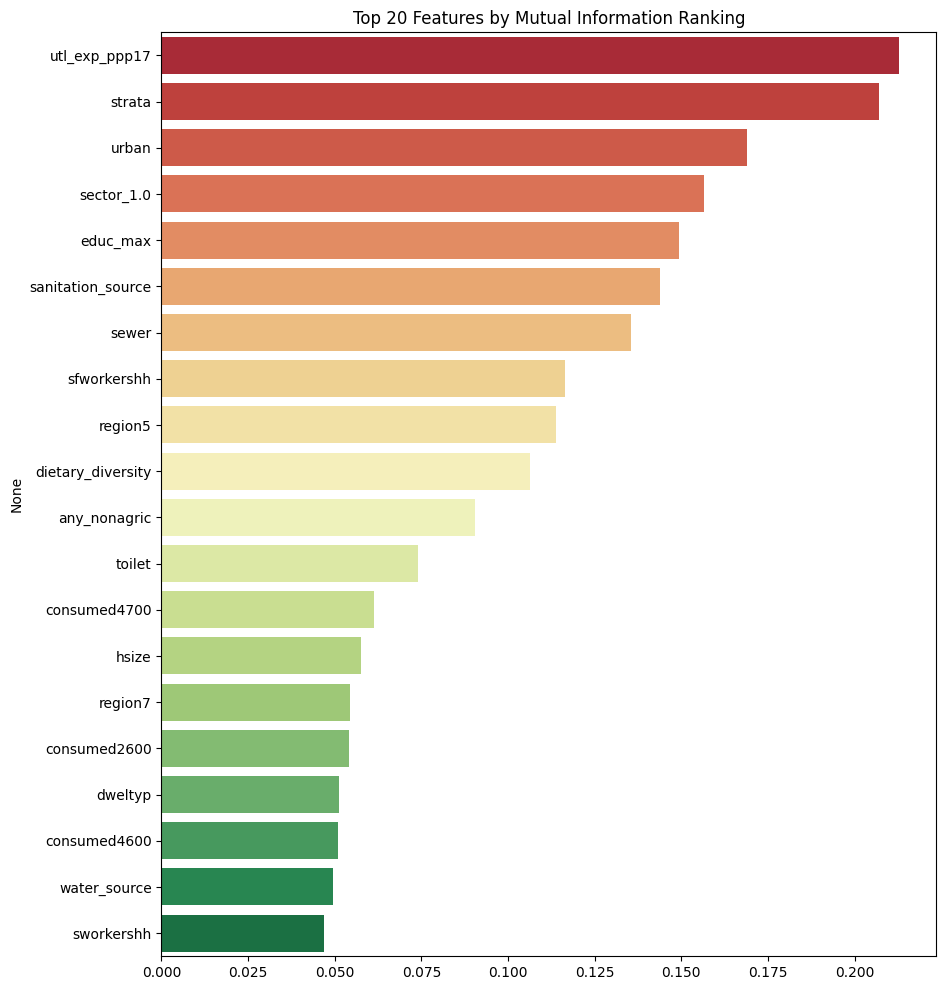

utl_exp_ppp17        0.212944
strata               0.207084
urban                0.168838
sector_1.0           0.156571
educ_max             0.149240
sanitation_source    0.143828
sewer                0.135588
sfworkershh          0.116375
region5              0.113866
dietary_diversity    0.106435
any_nonagric         0.090431
toilet               0.073921
consumed4700         0.061199
hsize                0.057704
region7              0.054324
consumed2600         0.053996
dweltyp              0.051210
consumed4600         0.050858
water_source         0.049544
sworkershh           0.046931
dtype: float64


In [21]:
from sklearn.feature_selection import mutual_info_regression

def get_mi_scores(df_features, df_labels, n_top):

    y = np.log1p(df_labels['cons_ppp17'])
    X = df_features.copy()

    mi_scores = mutual_info_regression(X, y, random_state=42)
    mi_results = pd.Series(mi_scores, index=X.columns).sort_values(ascending=False)

    plt.figure(figsize=(10, 12))
    mi_results.head(n_top).plot(kind='barh', color='teal')
    plt.title(f"Top {n_top} Features by Mutual Information Ranking")
    top_features = mi_results.head(n_top)
    sns.barplot(x=top_features.values, y=top_features.index, palette='RdYlGn')
    plt.show()

    return mi_results

n_top = 20
mi_rankings = get_mi_scores(df, labels_df, n_top)
print(mi_rankings.head(20))

### Combine feature selection algorithms to get the final ranking

In [22]:
def get_fused_ranking(correlations, feature_importances, mi_rankings):

    xgb_rank = feature_importances.rank(ascending=False)

    mi_rank = mi_rankings.rank(ascending=False)

    corr_rank = correlations.rank(ascending=False)

    # Fuse Rankings
    fused = pd.DataFrame({'xgb': xgb_rank, 'mi': mi_rank, 'corr': corr_rank})
    fused['mean_rank'] = fused.mean(axis=1)
    sorted_fused = fused.sort_values('mean_rank')

    return sorted_fused

final_features_rank = get_fused_ranking(correlations, feature_importances, mi_rankings)

top_features = final_features_rank.head(20)
print("Top Features:\n", top_features)
bottom_features = final_features_rank.tail(20)
print("\n\nBottom Features:\n", bottom_features)

Top Features:
                  xgb    mi  corr  mean_rank
strata           2.0   2.0   1.0   1.666667
sector_1.0       1.0   4.0   4.0   3.000000
utl_exp_ppp17    6.0   1.0   2.0   3.000000
educ_max         5.0   5.0   5.0   5.000000
sewer            3.0   7.0   7.0   5.666667
sfworkershh     11.0   8.0   6.0   8.333333
consumed2600     4.0  16.0   9.0   9.666667
region7          9.0  15.0  10.0  11.333333
consumed4700     7.0  13.0  15.0  11.666667
region5         18.0   9.0   8.0  11.666667
hsize            8.0  14.0  13.0  11.666667
consumed4600    10.0  18.0  16.0  14.666667
any_nonagric    19.0  11.0  14.0  14.666667
consumed2700    13.0  24.0  20.0  19.000000
num_children10  16.0  26.0  18.0  20.000000
num_children5   12.0  29.0  22.0  21.000000
num_children18  28.0  22.0  17.0  22.333333
consumed3500    15.0  31.0  26.0  24.000000
consumed2400    14.0  30.0  29.0  24.333333
water           34.0  27.0  19.0  26.666667


Bottom Features:
                       xgb     mi   corr  

## Keep top N features

Here, we keep all features and save the ranking in a csv format. Then, in the "Train Models.ipynb" we will make a wrapper method to deciside how many features to keep for the final model.

In [24]:
def keep_topN_features(df, final_features_rank, top_N):

  ranked_selection = final_features_rank.head(top_N).index.tolist()

  # Filter the original columns to keep only those in the selection
  # This preserves the original 'left-to-right' order of df
  ordered_selection = [col for col in df.columns if col in ranked_selection]

  df = df[ordered_selection]

  print(f"Kept {len(ordered_selection)} features.")

  return df

all_features_count = final_features_rank.shape[0]
df = keep_topN_features(df, final_features_rank, all_features_count)
df.head()

Kept 105 features.


,weight,strata,utl_exp_ppp17,male,hsize,num_children5,num_children10,num_children18,age,owner,...,sector_10.0,sector_11.0,sector_12.0,sector_13.0,sector_14.0,sector_15.0,sector_16.0,dietary_diversity,grain_score,protein_score
0,75,4,594.80627,0,1,0,0,0,75,1,...,0,0,0,0,0,0,0,25.0,2.0,1.0
1,150,4,1676.27230,0,2,0,0,0,61,1,...,0,0,0,0,0,0,0,36.0,4.0,3.0
2,375,4,506.93719,1,5,0,0,2,49,1,...,0,0,0,0,0,0,0,37.0,4.0,2.0
3,375,4,824.61786,1,5,0,0,1,58,0,...,0,0,1,0,0,0,0,35.0,4.0,4.0
4,525,4,351.47644,1,7,1,0,0,57,1,...,0,0,0,0,0,0,0,37.0,4.0,3.0


In [27]:
final_features_rank.index.name = 'features'
final_features_rank.to_csv('Final_features_rank.csv', index=True)

## Standardization: Z-Score

In [25]:
def Scaling(df):
  scaler = StandardScaler()
  df_scaled = pd.DataFrame(scaler.fit_transform(df), columns=df.columns)
  df_scaled.to_csv('Preprocessed_train_data.csv', index=False)

  return df_scaled, scaler

df_scaled, scaler = Scaling(df)
df_scaled.head()

,weight,strata,utl_exp_ppp17,male,hsize,num_children5,num_children10,num_children18,age,owner,...,sector_10.0,sector_11.0,sector_12.0,sector_13.0,sector_14.0,sector_15.0,sector_16.0,dietary_diversity,grain_score,protein_score
0,-0.759005,-0.174886,0.193774,-1.627107,-1.354682,-0.512519,-0.565065,-0.686742,1.424496,0.601518,...,-0.057627,-0.160511,-0.203349,-0.199637,-0.120342,-0.144087,-0.096211,-0.366940,-1.148122,-0.762587
1,-0.692141,-0.174886,2.665483,-1.627107,-0.835975,-0.512519,-0.565065,-0.686742,0.534607,0.601518,...,-0.057627,-0.160511,-0.203349,-0.199637,-0.120342,-0.144087,-0.096211,0.873562,0.773184,1.203587
2,-0.491548,-0.174886,-0.007053,0.614588,0.720145,-0.512519,-0.565065,1.718643,-0.228156,0.601518,...,-0.057627,-0.160511,-0.203349,-0.199637,-0.120342,-0.144087,-0.096211,0.986335,0.773184,0.220500
3,-0.491548,-0.174886,0.719012,0.614588,0.720145,-0.512519,-0.565065,0.515951,0.343916,-1.662461,...,-0.057627,-0.160511,4.917660,-0.199637,-0.120342,-0.144087,-0.096211,0.760789,0.773184,2.186675
4,-0.357820,-0.174886,-0.362361,0.614588,1.757559,1.267856,-0.565065,-0.686742,0.280353,0.601518,...,-0.057627,-0.160511,-0.203349,-0.199637,-0.120342,-0.144087,-0.096211,0.986335,0.773184,1.203587


# Preprocessing and feature engineering of the Test Set

In [26]:
test_df = pd.DataFrame(pd.read_csv("test_hh_features.csv"))
print(f"Train Dataset Number of samples: {test_df.shape[0]} and Number of features: {test_df.shape[1]}")
test_df


Train Dataset Number of samples: 103023 and Number of features: 88


,hhid,com,weight,strata,utl_exp_ppp17,male,hsize,num_children5,num_children10,num_children18,...,consumed4200,consumed4300,consumed4400,consumed4500,consumed4600,consumed4700,consumed4800,consumed4900,consumed5000,survey_id
0,400001,1,320,4,567.80914,Female,4,0,1,0,...,No,No,No,No,No,Yes,Yes,Yes,No,400000
1,400002,1,480,4,561.70367,Female,6,0,1,1,...,Yes,No,No,No,No,Yes,Yes,Yes,No,400000
2,400003,1,320,4,183.16423,Male,4,0,0,0,...,Yes,No,Yes,No,Yes,Yes,No,Yes,No,400000
3,400004,1,320,4,696.02411,Male,4,0,0,1,...,Yes,Yes,No,No,No,Yes,Yes,No,No,400000
4,400005,1,320,4,286.95731,Male,4,0,0,1,...,Yes,No,No,No,No,No,Yes,No,No,400000
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
103018,634209,1,963,8,402.71024,Male,3,0,0,0,...,Yes,No,No,Yes,No,No,Yes,Yes,No,600000
103019,634210,1,2247,8,238.44685,Male,7,1,2,2,...,Yes,Yes,No,Yes,No,Yes,Yes,Yes,No,600000
103020,634211,1,963,8,211.95276,Male,3,0,0,1,...,Yes,No,No,Yes,No,No,Yes,Yes,No,600000
103021,634212,1,642,8,254.34331,Female,2,0,0,0,...,Yes,Yes,No,Yes,No,Yes,No,Yes,No,600000


## NaN Count on Test Set

In [27]:
test_df_nan_values = test_df.isna().sum()

test_df_nonzero_nan = test_df_nan_values[test_df_nan_values != 0].to_frame(name="nan_count")
test_df_nonzero_nan

,nan_count
utl_exp_ppp17,283
dweltyp,1122
employed,54
share_secondary,10
educ_max,11
sector1d,15589
consumed100,14
consumed200,20
consumed300,18
consumed400,16


We observe that the missing values are in the same features as in the train set (apart from the "consumedXXXX" features, which are handled all toghether).

## Apply the preprocessing/feature engineering pipeline

In this section we will apply to the Test dataset the same preprocessing and feature engineering pipeline as in the Train dataset.

In [30]:
test_df = pd.DataFrame(pd.read_csv("test_hh_features.csv"))

# Preprocess
test_df = categ_to_num_encoding(val_desc, test_df)
test_df = apply_ordinal_encoding(val_desc, test_df)
test_df = handle_missing_values(test_df)

# Feature Engineering
test_df.drop(columns=["com", "survey_id", "hhid"], inplace=True)

test_df = aggregate_consumption(test_df)

# Keep only the features that were kept in the training set
test_df = keep_topN_features(test_df, final_features_rank, all_features_count)
test_df.head()

Mapping of categorical variables from feature_value_descriptions.csv file:

 {'any_nonagric': {'No': 0, 'Yes': 1}, 'consumed100': {'No': 0, 'Yes': 1}, 'consumed1000': {'No': 0, 'Yes': 1}, 'consumed1100': {'No': 0, 'Yes': 1}, 'consumed1200': {'No': 0, 'Yes': 1}, 'consumed1300': {'No': 0, 'Yes': 1}, 'consumed1400': {'No': 0, 'Yes': 1}, 'consumed1500': {'No': 0, 'Yes': 1}, 'consumed1600': {'No': 0, 'Yes': 1}, 'consumed1700': {'No': 0, 'Yes': 1}, 'consumed1800': {'No': 0, 'Yes': 1}, 'consumed1900': {'No': 0, 'Yes': 1}, 'consumed200': {'No': 0, 'Yes': 1}, 'consumed2000': {'No': 0, 'Yes': 1}, 'consumed2100': {'No': 0, 'Yes': 1}, 'consumed2200': {'No': 0, 'Yes': 1}, 'consumed2300': {'No': 0, 'Yes': 1}, 'consumed2400': {'No': 0, 'Yes': 1}, 'consumed2500': {'No': 0, 'Yes': 1}, 'consumed2600': {'No': 0, 'Yes': 1}, 'consumed2700': {'No': 0, 'Yes': 1}, 'consumed2800': {'No': 0, 'Yes': 1}, 'consumed2900': {'No': 0, 'Yes': 1}, 'consumed300': {'No': 0, 'Yes': 1}, 'consumed3000': {'No': 0, 'Yes': 1}, 

,weight,strata,utl_exp_ppp17,male,hsize,num_children5,num_children10,num_children18,age,owner,...,sector_10.0,sector_11.0,sector_12.0,sector_13.0,sector_14.0,sector_15.0,sector_16.0,dietary_diversity,grain_score,protein_score
0,320,4,567.80914,0,4,0,1,0,50,1,...,0,0,0,0,0,1,0,35.0,4.0,3.0
1,480,4,561.70367,0,6,0,1,1,65,1,...,0,0,0,0,0,0,0,31.0,4.0,1.0
2,320,4,183.16423,1,4,0,0,0,66,1,...,0,0,0,0,0,0,0,16.0,1.0,2.0
3,320,4,696.02411,1,4,0,0,1,50,1,...,0,0,0,0,0,0,0,36.0,4.0,3.0
4,320,4,286.95731,1,4,0,0,1,63,1,...,0,0,0,0,0,0,0,28.0,4.0,2.0


### Export the final, preprocessed test dataset in csv format

In [31]:
test_df = pd.DataFrame(scaler.transform(test_df), columns=test_df.columns)
test_df.to_csv('Preprocessed_test_data.csv', index=False)
test_df

,weight,strata,utl_exp_ppp17,male,hsize,num_children5,num_children10,num_children18,age,owner,...,sector_10.0,sector_11.0,sector_12.0,sector_13.0,sector_14.0,sector_15.0,sector_16.0,dietary_diversity,grain_score,protein_score
0,-0.540582,-0.174886,0.132071,-1.627107,0.201438,-0.512519,1.106397,-0.686742,-0.164592,0.601518,...,-0.057627,-0.160511,-0.203349,-0.199637,-0.120342,6.940244,-0.096211,0.760789,0.773184,1.203587
1,-0.397938,-0.174886,0.118117,-1.627107,1.238852,-0.512519,1.106397,0.515951,0.788861,0.601518,...,-0.057627,-0.160511,-0.203349,-0.199637,-0.120342,-0.144087,-0.096211,0.309697,0.773184,-0.762587
2,-0.540582,-0.174886,-0.747041,0.614588,0.201438,-0.512519,-0.565065,-0.686742,0.852424,0.601518,...,-0.057627,-0.160511,-0.203349,-0.199637,-0.120342,-0.144087,-0.096211,-1.381896,-2.108774,0.220500
3,-0.540582,-0.174886,0.425109,0.614588,0.201438,-0.512519,-0.565065,0.515951,-0.164592,0.601518,...,-0.057627,-0.160511,-0.203349,-0.199637,-0.120342,-0.144087,-0.096211,0.873562,0.773184,1.203587
4,-0.540582,-0.174886,-0.509821,0.614588,0.201438,-0.512519,-0.565065,0.515951,0.661734,0.601518,...,-0.057627,-0.160511,-0.203349,-0.199637,-0.120342,-0.144087,-0.096211,-0.028621,0.773184,0.220500
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
103018,0.032668,1.471825,-0.245265,0.614588,-0.317268,-0.512519,-0.565065,-0.686742,0.661734,0.601518,...,-0.057627,-0.160511,-0.203349,-0.199637,-0.120342,-0.144087,-0.096211,0.422470,-0.187469,-0.762587
103019,1.177385,1.471825,-0.620692,0.614588,1.757559,1.267856,2.777860,1.718643,-0.673101,0.601518,...,-0.057627,-0.160511,-0.203349,-0.199637,-0.120342,-0.144087,-0.096211,0.873562,-0.187469,0.220500
103020,0.032668,1.471825,-0.681245,0.614588,-0.317268,-0.512519,-0.565065,0.515951,0.598170,0.601518,...,-0.057627,-0.160511,-0.203349,-0.199637,-0.120342,-0.144087,-0.096211,0.760789,-0.187469,0.220500
103021,-0.253511,1.471825,-0.584360,-1.627107,-0.835975,-0.512519,-0.565065,-0.686742,0.915988,0.601518,...,-0.057627,-0.160511,-0.203349,-0.199637,-0.120342,-0.144087,-0.096211,-0.141394,-1.148122,-1.745675
